# ML Frameworks Interoperability

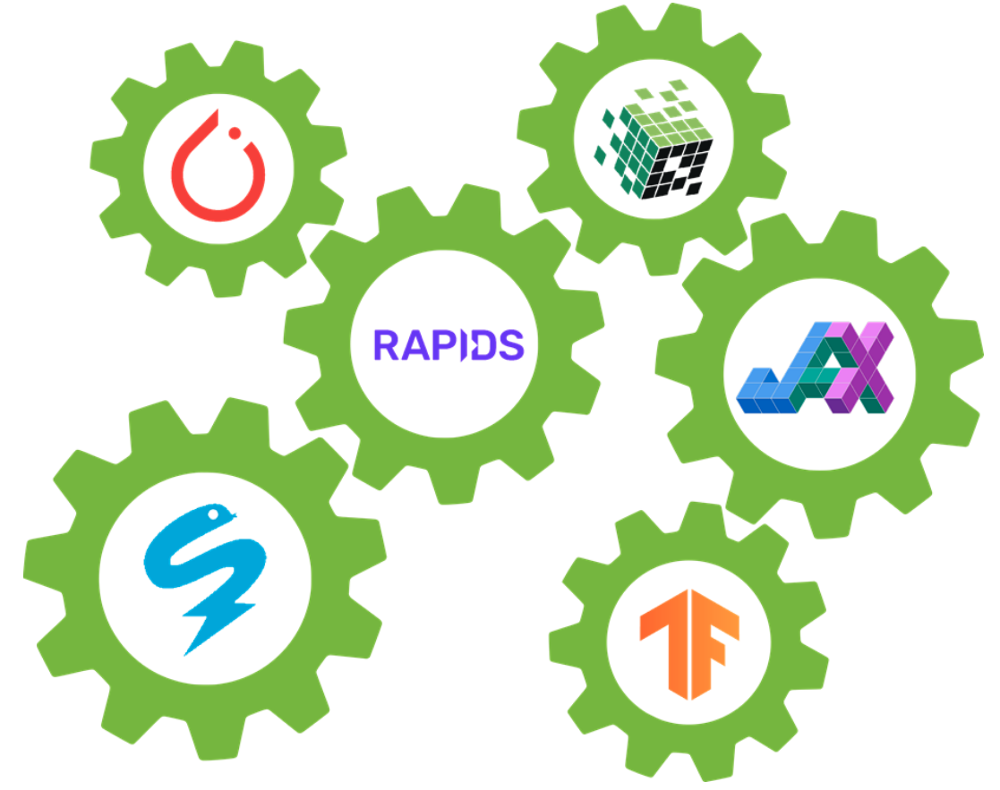

In this notebook, we will present an end-to-end pipeline for the anomaly detection of 20 hours of continuously measured heart beats.

The main objective of this work is to showcase the iteraction between different GPU-accelerated Machine Learning and Deep Learning libraries in a reasonable complex end-to-end pipeline.

Therefore, **the content of this notebook is not suitable for production in medical environments**.


## Getting started
In order to make it easier to have all those libraries up and running, we have used the RAPIDS 0.19 container on Ubuntu 18.04 as a base container, and then added a few missing libraries via [pip install](https://pip.pypa.io/en/stable/reference/pip_install/).

We encourage you to run this notebook on the latest RAPIDS container. Alternatively, you can also set up a [conda virtual environment](https://docs.conda.io/projects/conda/en/latest/user-guide/index.html). In both cases, please visit [RAPIDS release selector](https://rapids.ai/start.html#get-rapids) for installation details.

Finally, please find below the details of the container we used when creating this notebook . 
For reproducibility purposes, please use the following command:

```console
foo@bar:~$ docker pull rapidsai/rapidsai-dev:21.06-cuda11.0-devel-ubuntu18.04-py3.7
foo@bar:~$ docker run --gpus all --rm -it -p 8888:8888 -p 8787:8787 -p 8786:8786 \
                      -v ~:/rapids/notebooks/host rapidsai/rapidsai-dev:21.06-cuda11.0-devel-ubuntu18.04-py3.7
```

## Step 1: Loading the data

We will start loading a [CSV](https://en.wikipedia.org/wiki/Comma-separated_values) file containing 20 hours of heartbeats.

In [2]:
def retrieve_as_csv(url, root="./data"):

    # local import because we will never see them again ;)
    import os
    import urllib
    import zipfile
    import numpy as np
    from scipy.io import loadmat
    # you might need the two lines below when running on HiperGator to scrape data
    # import ssl
    # ssl._create_default_https_context = ssl._create_unverified_context
    
    filename = os.path.join(root, 'ECG_one_day.zip')
        
    if not os.path.isdir(root):
        os.makedirs(root)
    if not os.path.isfile(filename):
        urllib.request.urlretrieve(url, filename)
                    
    with zipfile.ZipFile(filename, 'r') as zip_ref:
        zip_ref.extractall(root)
        
    stream = loadmat(os.path.join(root, 'ECG_one_day','ECG.mat'))['ECG'].flatten()
    
    csvname = os.path.join(root, 'heartbeats.csv')
    
    if not os.path.isfile(csvname):
        np.savetxt(csvname, stream[:-140000], delimiter=",", header="heartbeats", comments="")

# store the data as csv on disk
url = "https://www.cs.ucr.edu/~eamonn/ECG_one_day.zip"
retrieve_as_csv(url)

From the multiple libraries that can be used to read data from a CSV file ([pandas](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.read_csv.html), [NumPy](https://numpy.org/doc/stable/reference/generated/numpy.genfromtxt.html), …), we have chosen to use [cuDF](https://docs.rapids.ai/api/cudf/stable/10min.html), a Python GPU-accelerated DataFrame library part of [RAPIDS](https://rapids.ai/) framework.

In [3]:
import cudf

heartbeats_cudf = cudf.read_csv("data/heartbeats.csv", dtype='float32')
heartbeats_cudf

,heartbeats
0,-0.020
1,-0.010
2,-0.005
3,-0.005
4,-0.005
...,...
19999995,-0.005
19999996,0.015
19999997,0.005
19999998,-0.005


Next, we will create a chart from the `heartbeats_cudf` DataFrame by making use of RAPIDS [cuxfilter](https://docs.rapids.ai/api/cuxfilter/stable/10%20minutes%20to%20cuxfilter.html) library.

We will get something similar to the following chart, but with a few nice features:

- The data is maintained in the GPU memory and operations like groupby aggregations, sorting and querying are done on the GPU itself, only returning the result as the output to the charts.
- The output is an interactive chart, facilitating data exploration.




In [8]:
import cuxfilter as cux
from cuxfilter.charts.datashader import line

# Chart width and height
WIDTH=600
HEIGHT=300

# 20 hours ECG look like a mess
heartbeats_cudf['x'] = heartbeats_cudf.index

line_cux = line(x='x', y='heartbeats', add_interaction=False,
               width=WIDTH, height=HEIGHT, title='ECG stream')

_ = cux.DataFrame.from_dataframe(heartbeats_cudf).dashboard([line_cux])
line_cux.view()
# line_cux.chart.title.text = 'ECG stream'
# line_cux.chart.title.align = 'center'
# line_cux.chart.width = WIDTH
# line_cux.chart.height = HEIGHT
# line_cux.view()[0]


# example from doc
# cux_df = DataFrame.from_dataframe(cudf.DataFrame({'x': np.linspace(start, end, n), 'y':np.random.normal(0, 0.3, size=n).cumsum() + 50}))
# line_chart_1 = line(x='x', y='y', unselected_alpha=0.2)
# d = cux_df.dashboard([line_chart_1])
# line_chart_1.view()

Card(sizing_mode='scale_width', title='ECG stream', width=600)
    [0] HoloViews(DynamicMap, height=400, sizing_mode='stretch_both')

## QRS complex detection

Let's sample a Ricker wavelet which is proportional to the (negative) second derivative of a Gaussian

$g''(\tau) \propto - \frac{d^2}{d\tau^2} exp(-\frac{\tau^2}{2}) = exp(-\frac{\tau^2}{2}) (1-\tau^2)$

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/0/08/MexicanHatMathematica.svg/2880px-MexicanHatMathematica.svg.png" alt="drawing" width="600"/>

Note that convolving a signal $f$ with the second derivative of a Gaussian $g$ is equivalent to smoothing $f$ with $g$ and then computing the second derivative, since

$(f \star g)' (t) = \frac{d}{dt} \int f(\tau) g(t-\tau) d \tau = \int f(\tau) \frac{d}{dt} g(t-\tau) d \tau = (f \star g')(t)$

and thus by induction:

$(f \star g)'' (t) = (f \star g'')(t)$

The standard deviation of the Gaussian governs the scale of the effect that we want to isolate. 

In [9]:
import cupy as cp

def get_ricker(window, length):
    
    time = cp.linspace(-3, +3, window)
    kernel = cp.zeros(length)
    
    # Using a ricker wavelet as bandpass filter (-) d^2/dt^2 exp(-0.5*t^2)    
    # https://www.wolframalpha.com/input/?i=d%5E2%2Fdt%5E2+exp%28-0.5*t%5E2%29
    # to isolate R in the QRS complex of each heartbeat
    kernel[:window] = cp.exp(-0.5 * time**2) * (1 - time**2)
    
    return 2*kernel/cp.sqrt(window)

wavelet = get_ricker(30, len(heartbeats_cudf))
wavelet

array([-0.03245146, -0.05023554, -0.07329639, ...,  0.        ,
        0.        ,  0.        ])

Subsequently, let us exploit the Fourier theorem to speed-up the convolution using the Fast Fourier Transform (FFT) in log-linear time.

$\mathcal F(f \star g) = \mathcal F(f) \odot \mathcal F(g) \Rightarrow f \star g = \mathcal F^{-1} \bigl(\mathcal F(f) \odot \mathcal F(g)\bigr)$

The (Hermitian) FFT is implemented in CuPy and accelerated by cuFFT under the hood. Conversion from cudf to CuPy is accomplished via DLPack:

In [10]:
def fftconv(signal, kernel):
    
    # compute 'signal o kernel', where 'o' is 1D convolution, by exploiting Fourier theorem:
    #    F(signal) * F(kernel) = F(signal o kernel)
    # this can be done in O(n log n) time where n is the length of the signal

    return cp.fft.irfft(cp.fft.rfft(signal)*cp.fft.rfft(kernel), n=len(signal))

# convert heartbeats from cuDF to cupy
heartbeats_cupy = cp.fromDlpack(heartbeats_cudf['heartbeats'].to_dlpack())
    
# compute smoothed curvature via ricker wavelet
curvature_cupy = fftconv(heartbeats_cupy, wavelet)

Let's plot this.

In [13]:
from cuxfilter.charts import stacked_lines

# wavelet convolution removes local offset shift
NUM_ELEMENTS = 2000

curvature_cudf = cudf.DataFrame({'heartbeats': heartbeats_cupy[:NUM_ELEMENTS],
                                 'curvature': curvature_cupy[:NUM_ELEMENTS],
                                 'x': cp.arange(0, NUM_ELEMENTS)}).astype('float64')

stacked_lines_cux = stacked_lines(x='x', y=['heartbeats', 'curvature'],
                                  legend=False, colors = ["blue", "orange"],
                                  add_interaction=False,
                                  width=WIDTH, height=HEIGHT, title='Stream and smoothed curvature')

_ = cux.DataFrame.from_dataframe(curvature_cudf).dashboard([stacked_lines_cux])
stacked_lines_cux.view()

# stacked_lines_cux.chart.title.text = 'Stream and smoothed curvature'
# stacked_lines_cux.chart.title.align ='center'
# stacked_lines_cux.chart.width = WIDTH
# stacked_lines_cux.chart.height = HEIGHT
# stacked_lines_cux.view()[0]

# d = cux_df.dashboard([stacked_lines_chart])

# stacked_lines_chart.view()

Card(sizing_mode='scale_width', title='Stream and smoothed c..., width=600)
    [0] HoloViews(DynamicMap, height=400, sizing_mode='stretch_both')

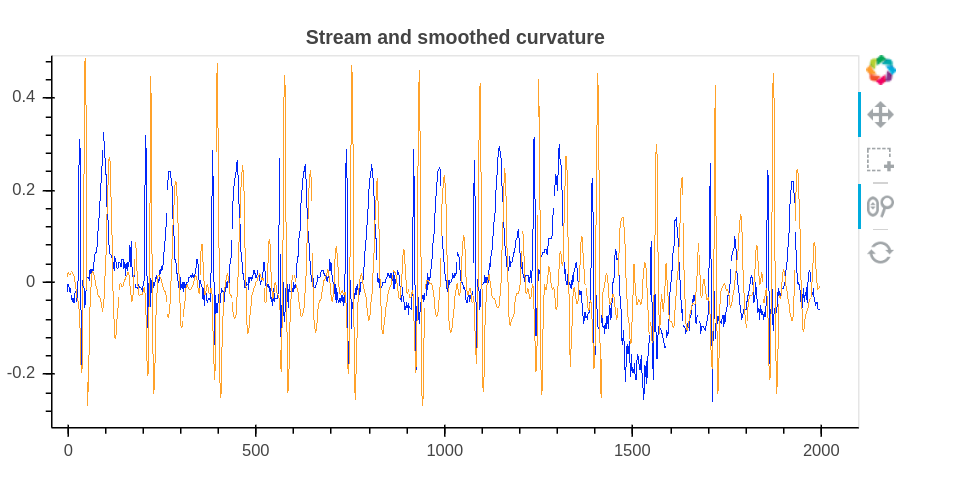



## 1D Non-maximum suppression for robust local maxima detection

Our goal is now to detect the local maxima in the curvature graph above to partition the stream into individual heartbeats. To achieve that we implement a basic CUDA kernel using the jit-compiler [Numba](http://numba.pydata.org/). The kernel determines for each value in the curvature signal if it is the maximum in a predefined window. In the following, we spawn a fixed number of CUDA threads being (re-)used to enumerate the whole range of positions in the stream. Note that the corresponding indexing scheme is called [grid-stride loop](https://developer.nvidia.com/blog/cuda-pro-tip-write-flexible-kernels-grid-stride-loops/). Each of the CUDA threads sequentially performs a max-reduction to determine the maximum. Although Numba comes with its own data types for device arrays, we can seamlessly pass CuPy arrays to Numba kernels without explicit type conversion. Both Numba and CuPy support the [CUDA array interface](https://numba.readthedocs.io/en/stable/cuda/cuda_array_interface.html) which allows for efficient zero-copy functionality across frameworks. 

In [14]:
from numba import cuda
import math

@cuda.jit
def segment_kernel(signal, window, out):
    
    base, step = cuda.grid(1), cuda.gridsize(1)    
    for position in range(base, signal.shape[0] - window + 1, step):        
        accum = -math.inf
        for index in range(window):            
            value = signal[position + index]
            accum = value if value > accum else accum
    
        #                 am I the maximum in my neighborhood?
        out[position] = 1 if accum == signal[position + (window + 1)//2] else 0

def segment_numba(signal, window):
    
    out = cp.empty(signal.shape[0] - window + 1, dtype=cp.int64)
    segment_kernel[80*32, 64](signal, window, out)    
    cuda.synchronize()
    
    # fixes sequences of the following for 0000011000-> 0000010000
    out[1:] *= (cp.diff(out) == 1)
    
    return out

# let's segment the signal at the maximum peaks of the curvature graph
gate_cupy = segment_numba(curvature_cupy, window=180)

Let's inspect the gates. Looks good!

In [15]:
gate_cudf = cudf.DataFrame({'heartbeats': heartbeats_cupy[:NUM_ELEMENTS],
                            'gate': gate_cupy[:NUM_ELEMENTS],
                            'x': cp.arange(0, NUM_ELEMENTS)}).astype('float64')


stacked_lines_cux = stacked_lines(x='x', y=['heartbeats', 'gate'],
                                  legend=False, colors = ["blue", "orange"],
                                  add_interaction=False,
                                  width=WIDTH, height=HEIGHT,
                                  title='Segmentation gates')

_ = cux.DataFrame.from_dataframe(gate_cudf).dashboard([stacked_lines_cux])
stacked_lines_cux.view()
# stacked_lines_cux.chart.title.text = 'Segmentation gates'
# stacked_lines_cux.chart.title.align ='center'
# stacked_lines_cux.chart.width = WIDTH
# stacked_lines_cux.chart.height = HEIGHT
# stacked_lines_cux.view()[0]

Card(sizing_mode='scale_width', title='Segmentation gates', width=600)
    [0] HoloViews(DynamicMap, height=400, sizing_mode='stretch_both')

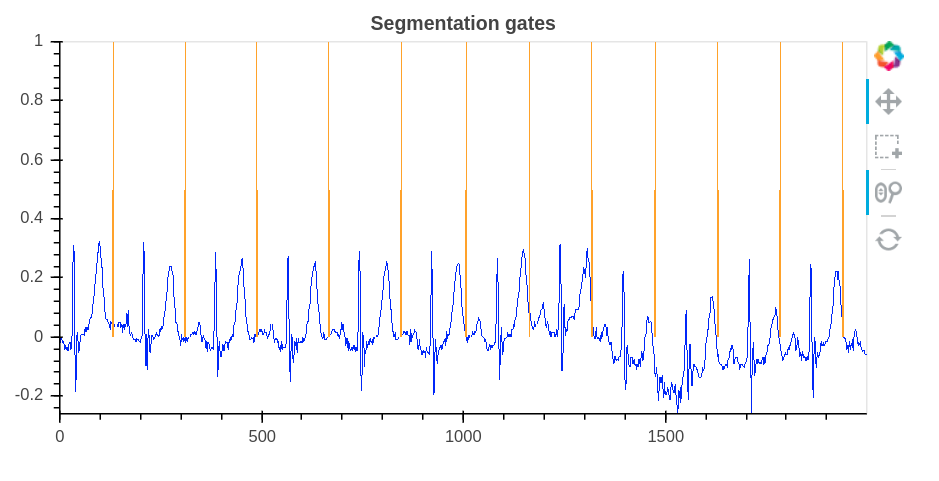

## Inspecting heart beat lengths

The binary mask gate_cupy is 1 for each position that starts a heartbeat and 0 otherwise. Subsequently, we want to transform this dense representation with many zeroes to a sparse one where one only stores the indices in the stream that start a heartbeat. You could write a CUDA-kernel using [warp-aggregated atomics](https://developer.nvidia.com/blog/cuda-pro-tip-optimized-filtering-warp-aggregated-atomics/) for that purpose. In CuPy, however, this can be achieved easier by filtering the index domain with the predicate gate==1. An adjacent difference (discrete derivative cupy.diff) computes the heartbeat lengths as index distance between positive gate positions. Finally, the computed lengths are visualized in a histogram.

In [16]:
def indices_and_lengths_cupy(gate):

    # all indices 0 1 2 3 4 5 6 ...
    iota = cp.arange(len(gate))

    # after filtering with gate==1 it becomes 3 6 10
    indices = iota[gate == 1]
    lengths = cp.diff(indices)
    
    return indices, lengths

In [17]:
from cuxfilter.charts import bar

# inspect the segment lengths, we will later prune very long and short segments
indices_cupy, lengths_cupy = indices_and_lengths_cupy(gate_cupy)

# currently, cuxfilter doesn't support histogram chart with density=True,
# so we will create a histogram chart from a bar chart
BINS=30
lengths_hist_cupy = cp.histogram(lengths_cupy, bins=BINS, density=True)

hist_range = cp.max(lengths_cupy) - cp.min(lengths_cupy)
hist_width = int(hist_range/BINS)

lengths_cudf = cudf.DataFrame({'length': lengths_hist_cupy[0]})
lengths_cudf = lengths_cudf.loc[lengths_cudf.index.repeat(hist_width)]
lengths_cudf['x'] = cp.arange(0, BINS * hist_width) + cp.min(lengths_cupy)

bar_cux = bar(x='x', y='length', add_interaction=False,
              width=WIDTH, height=HEIGHT,
              title='Segment lengths')

_ = cux.DataFrame.from_dataframe(lengths_cudf).dashboard([bar_cux])
bar_cux.view()
# bar_cux.chart.title.text = 'Segment lengths'
# bar_cux.chart.title.align = 'center'
# bar_cux.chart.left[0].axis_label = ""
# bar_cux.chart.width = WIDTH
# bar_cux.chart.height = HEIGHT
# bar_cux.view()[0]

Card(sizing_mode='scale_width', title='Segment lengths', width=600)
    [0] Bokeh(Figure)

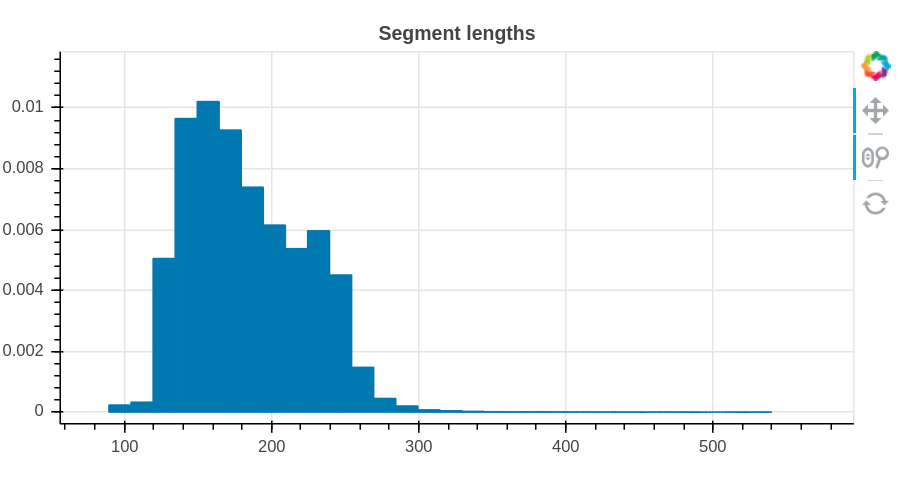

## Candidate pruning and embedding in fixed length vectors

In a later stage we intend to train a Variational Autoencoder (VAE) with fixed-length input and thus the heartbeats must be embedded in a data matrix of fixed shape. According to the histogram the majority of length is somewhere in the range between 100 and 250. The embedding is accomplished with Numba kernel. A warp of 32 consecutive threads works on each heartbeat. The first thread in a warp (leader) checks if the heartbeat exhibits a valid length and increments a row counter in an atomic manner to determine the output row in the data matrix. Subsequently, the target row is communicated to the remaining 31 threads in the warp using the warp-intrinsic shfl_sync (broadcast). In a final step, we (re-)use the threads in the warp to write the values to the output row in the data matrix in a warp-cyclic fashion (warp-stride loop). Finally, we plot a few of the zero-embedded heartbeats and observe approximate alignment of the QRS complex -- exactly what we wanted to achieve.

In [18]:
@cuda.jit
def zero_padding_kernel(signal, indices, counter, lower, upper, out):
    """using warp intrinsics to speedup the calcuation"""
    
    for candidate in range(cuda.blockIdx.x, indices.shape[0]-1, cuda.gridDim.x):
        length = indices[candidate+1]-indices[candidate]
        
        # warp-centric: 32 threads process one signal
        if lower <= length <= upper:
            
            entry = 0
            if cuda.threadIdx.x == 0:
                # here we select in thread 0 what will be the target row
                entry = cuda.atomic.add(counter, 0, 1)
            
            # broadcast the target row to all other threads 
            # all 32 threads (warp) know the value
            entry = cuda.shfl_sync(0xFFFFFFFF, entry, 0)  
            
            for index in range(cuda.threadIdx.x, upper, 32):                
                out[entry, index] = signal[indices[candidate]+index] if index < length else 0.0
                
def zero_padding_numba(signal, indices, lengths, lower=100, upper=256):
    
    mask = (lower <= lengths) * (lengths <= upper)
    num_entries = int(cp.sum(mask))
    
    out = cp.empty((num_entries, upper), dtype=signal.dtype)
    counter = cp.zeros(1).astype(cp.int64)
    zero_padding_kernel[80*32, 32](signal, indices, counter, lower, upper, out)    
    cuda.synchronize()
    
    print("removed", 100-100*num_entries/len(lengths), "percent of the candidates")
    
    return out

# let's prune the short and long segments (heartbeats) and normalize them
data_cupy = zero_padding_numba(heartbeats_cupy, indices_cupy, lengths_cupy, lower=100, upper=256)    

removed 3.3824004429883274 percent of the candidates


In [19]:
# looks good, they are approximately aligned

HEARTBEATS_SAMPLE = 10
data_cudf = cudf.DataFrame({'y_{}'.format(i):data_cupy[i] for i in range(HEARTBEATS_SAMPLE)})
data_cudf['x'] = cp.arange(0, data_cupy.shape[1])
data_cudf = data_cudf.astype('float64')


stacked_lines_cux = stacked_lines(x='x', y=['y_{}'.format(i) for i in range(HEARTBEATS_SAMPLE)],
                                  legend=False, add_interaction=False,
                                  colors = ["red", "grey", "black", "purple", "pink",
                                            "yellow", "brown", "green", "orange", "blue"],
                                  width=WIDTH, height=HEIGHT,
                                  title='A few heartbeats')
                                  

_ = cux.DataFrame.from_dataframe(data_cudf).dashboard([stacked_lines_cux])
stacked_lines_cux.view()
# stacked_lines_cux.chart.title.text = 'A few heartbeats'
# stacked_lines_cux.chart.title.align = 'center'
# stacked_lines_cux.chart.width = WIDTH
# stacked_lines_cux.chart.height = HEIGHT
# stacked_lines_cux.view()[0]

Card(sizing_mode='scale_width', title='A few heartbeats', width=600)
    [0] HoloViews(DynamicMap, height=400, sizing_mode='stretch_both')

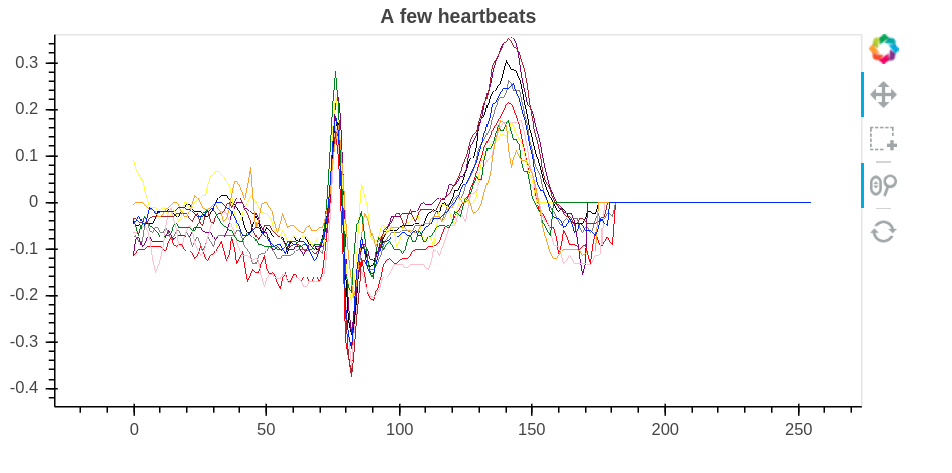

## Training a Variational Autoencoder (VAE)

In the last step, we train a Variational Autencoder (VAE) using Pytorch. Hence, let use first install the package torch via pip. That might take a while.

In [20]:
# Don't use pip install within Jupyter Notebook on HiperGator, see https://help.rc.ufl.edu/doc/Managing_Python_environments_and_Jupyter_kernels
# print("Installing PyTorch...")
# !pip -q install torch==1.7.1+cu110 torchvision==0.8.2+cu110 torchaudio===0.7.2 -f https://download.pytorch.org/whl/torch_stable.html

^C
ERROR: Operation cancelled by user


In [1]:
import monai
monai.config.print_config()

MONAI version: 0.9.1
Numpy version: 1.22.0
Pytorch version: 1.12.1.post200
MONAI flags: HAS_EXT = False, USE_COMPILED = False, USE_META_DICT = False
MONAI rev id: 356d2d2f41b473f588899d705bbc682308cee52c
MONAI __file__: /home/hju/anaconda3/envs/rapids_monaicore/lib/python3.9/site-packages/monai/__init__.py

Optional dependencies:
Pytorch Ignite version: NOT INSTALLED or UNKNOWN VERSION.
Nibabel version: NOT INSTALLED or UNKNOWN VERSION.
scikit-image version: 0.19.3
Pillow version: 9.2.0
Tensorboard version: NOT INSTALLED or UNKNOWN VERSION.
gdown version: NOT INSTALLED or UNKNOWN VERSION.
TorchVision version: NOT INSTALLED or UNKNOWN VERSION.
tqdm version: 4.64.1
lmdb version: NOT INSTALLED or UNKNOWN VERSION.
psutil version: 5.9.1
pandas version: 1.4.4
einops version: NOT INSTALLED or UNKNOWN VERSION.
transformers version: NOT INSTALLED or UNKNOWN VERSION.
mlflow version: NOT INSTALLED or UNKNOWN VERSION.
pynrrd version: NOT INSTALLED or UNKNOWN VERSION.

For details about installing 

In [21]:
import monai
monai.config.print_config()

MONAI version: 0.9.1
Numpy version: 1.22.0
Pytorch version: 1.12.1.post200
MONAI flags: HAS_EXT = False, USE_COMPILED = False, USE_META_DICT = False
MONAI rev id: 356d2d2f41b473f588899d705bbc682308cee52c
MONAI __file__: /home/hju/anaconda3/envs/rapids_monaicore/lib/python3.9/site-packages/monai/__init__.py

Optional dependencies:
Pytorch Ignite version: NOT INSTALLED or UNKNOWN VERSION.
Nibabel version: NOT INSTALLED or UNKNOWN VERSION.
scikit-image version: 0.19.3
Pillow version: 9.2.0
Tensorboard version: NOT INSTALLED or UNKNOWN VERSION.
gdown version: NOT INSTALLED or UNKNOWN VERSION.
TorchVision version: NOT INSTALLED or UNKNOWN VERSION.
tqdm version: 4.64.1
lmdb version: NOT INSTALLED or UNKNOWN VERSION.
psutil version: 5.9.1
pandas version: 1.4.4
einops version: NOT INSTALLED or UNKNOWN VERSION.
transformers version: NOT INSTALLED or UNKNOWN VERSION.
mlflow version: NOT INSTALLED or UNKNOWN VERSION.
pynrrd version: NOT INSTALLED or UNKNOWN VERSION.

For details about installing 

Subsequently, we define the network topology. Here, we use a convolutional version but you could also experiment with a classical [MLP VAE](https://github.com/pytorch/examples/blob/master/vae/main.py).

In [22]:
import torch

class Swish(torch.nn.Module):    

    def __init__(self):
        super().__init__()        
        self.alpha = torch.nn.Parameter(torch.tensor([1.0], requires_grad=True))
    
    def forward(self, x):
        return x*torch.sigmoid(self.alpha.to(x.device)*x)

class Downsample1d(torch.nn.Module):    
    
    def __init__(self):
        super().__init__()
        
        self.filter = torch.tensor([1.0, 2.0, 1.0]).view(1, 1, 3)
    
    def forward(self, x):
        w = torch.cat([self.filter]*x.shape[1], dim=0).to(x.device)
        return torch.nn.functional.conv1d(x, w, stride=2, padding=1, groups=x.shape[1])

class LightVAE(torch.nn.Module):
    def __init__(self, num_dims):
        super(LightVAE, self).__init__()
        
        self.num_dims = num_dims
        assert num_dims & num_dims-1 == 0, "num_dims must be power of 2"
        
        self.down   = Downsample1d()
        self.up     = torch.nn.Upsample(scale_factor=2)
        self.sigma  = Swish()
        
        self.conv0  = torch.nn.Conv1d(1, 2, kernel_size=3, stride=1, padding=1)
        self.conv1  = torch.nn.Conv1d(2, 4, kernel_size=3, stride=1, padding=1)
        self.conv2  = torch.nn.Conv1d(4, 8, kernel_size=3, stride=1, padding=1)
        self.convA  = torch.nn.Conv1d(8, 2, kernel_size=3, stride=1, padding=1)
        self.convB  = torch.nn.Conv1d(8, 2, kernel_size=3, stride=1, padding=1)

        self.restore = torch.nn.Linear(2, 8*num_dims//8)
        
        self.conv3  = torch.nn.Conv1d( 8, 4, kernel_size=3, stride=1, padding=1)
        self.conv4  = torch.nn.Conv1d( 4, 2, kernel_size=3, stride=1, padding=1)
        self.conv5  = torch.nn.Conv1d( 2, 1, kernel_size=3, stride=1, padding=1)
        
    def encode(self, x):
        
        x  = x.view(-1, 1, self.num_dims)
        x  = self.down(self.sigma(self.conv0(x)))
        x  = self.down(self.sigma(self.conv1(x)))
        x  = self.down(self.sigma(self.conv2(x)))
        
        return torch.mean(self.convA(x), dim=(2,)), \
               torch.mean(self.convB(x), dim=(2,))

    def reparameterize(self, mu, logvar):
        
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)
        
        return mu + eps*std

    def decode(self, z):
        
        x = self.restore(z).view(-1, 8, self.num_dims//8)
        x = self.sigma(self.conv3(self.up(x)))
        x = self.sigma(self.conv4(self.up(x)))   
              
        return self.conv5(self.up(x)).view(-1, self.num_dims)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar
    
# Reconstruction + KL divergence losses summed over all elements and batch
def loss_function(recon_x, x, mu, logvar):
    MSE = torch.sum(torch.mean(torch.square(recon_x-x), dim=1))

    # see Appendix B from VAE paper:
    # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
    # https://arxiv.org/abs/1312.6114
    # 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
    KLD = -0.1 * torch.sum(torch.mean(1 + logvar - mu.pow(2) - logvar.exp(), dim=1))

    return MSE + KLD

Pytorch expects its dedicated tensor type and thus we need to map the CuPy array data_cupy to a FloatTensor. We perform that again using zero-copy functionality via DLPack. The remaining code is plain Pytorch program that trains the VAE on the training set for 10 epochs using the Adam optimizer.

In [23]:
# zero-copy to pytorch tensors using dlpack
from torch.utils import dlpack

cp.random.seed(42)
cp.random.shuffle(data_cupy)

split = int(0.75*len(data_cupy))
trn_torch = dlpack.from_dlpack(data_cupy[:split].toDlpack())
tst_torch = dlpack.from_dlpack(data_cupy[split:].toDlpack())

dim = trn_torch.shape[1]
model = LightVAE(dim).to('cuda')
optimizer = torch.optim.Adam(model.parameters())

In [24]:
# let's train a VAE
NUM_EPOCHS = 10
BATCH_SIZE = 1024

trn_loader = torch.utils.data.DataLoader(trn_torch, batch_size=BATCH_SIZE, shuffle=True)
tst_loader = torch.utils.data.DataLoader(tst_torch, batch_size=BATCH_SIZE, shuffle=False)

model.train()
for epoch in range(NUM_EPOCHS):
    trn_loss = 0.0
    for data in trn_loader:
        optimizer.zero_grad()
        recon_batch, mu, logvar = model(data)
        loss = loss_function(recon_batch, data, mu, logvar)
        loss.backward()
        trn_loss += loss.item()
        optimizer.step()
       
    print('====> Epoch: {} Average loss: {:.4f}'.format(
          epoch, trn_loss / len(trn_loader.dataset)))

====> Epoch: 0 Average loss: 0.0461
====> Epoch: 1 Average loss: 0.0131
====> Epoch: 2 Average loss: 0.0090
====> Epoch: 3 Average loss: 0.0082
====> Epoch: 4 Average loss: 0.0077
====> Epoch: 5 Average loss: 0.0074
====> Epoch: 6 Average loss: 0.0071
====> Epoch: 7 Average loss: 0.0069
====> Epoch: 8 Average loss: 0.0068
====> Epoch: 9 Average loss: 0.0067


Let's check if the test loss is in the same range:

In [25]:
# it will be used to visualize a scatter char
mu_cudf = cudf.DataFrame()

model.eval()
with torch.no_grad():
    tst_loss = 0
    for data in tst_loader:
        recon_batch, mu, logvar = model(data)
        tst_loss += loss_function(recon_batch, data, mu, logvar).item()
        mu_cudf = mu_cudf.append(cudf.DataFrame(mu, columns=['x', 'y']))
            
tst_loss /= len(tst_loader.dataset)
print('====> Test set loss: {:.4f}'.format(tst_loss))

====> Test set loss: 0.0058


 Finally, we visualize the latent space which is an approximate isotropic Gaussian centered around the origin:

In [28]:
from cuxfilter.charts import scatter
    
scatter_chart_cux = scatter(x='x', y='y', pixel_shade_type="linear",
                            legend=True, add_interaction=False,
                            width=WIDTH, height=2*HEIGHT,
                            title='Latent space')
    
_ = cux.DataFrame.from_dataframe(mu_cudf).dashboard([scatter_chart_cux])
scatter_chart_cux.view()
# scatter_chart_cux.chart.title.text = 'Latent space'
# scatter_chart_cux.chart.title.align = 'center'
# scatter_chart_cux.chart.width = WIDTH
# scatter_chart_cux.chart.height = 2*HEIGHT
# scatter_chart_cux.view()[0]

Card(sizing_mode='scale_width', title='Latent space', width=600)
    [0] HoloViews(DynamicMap, height=400, sizing_mode='stretch_both')

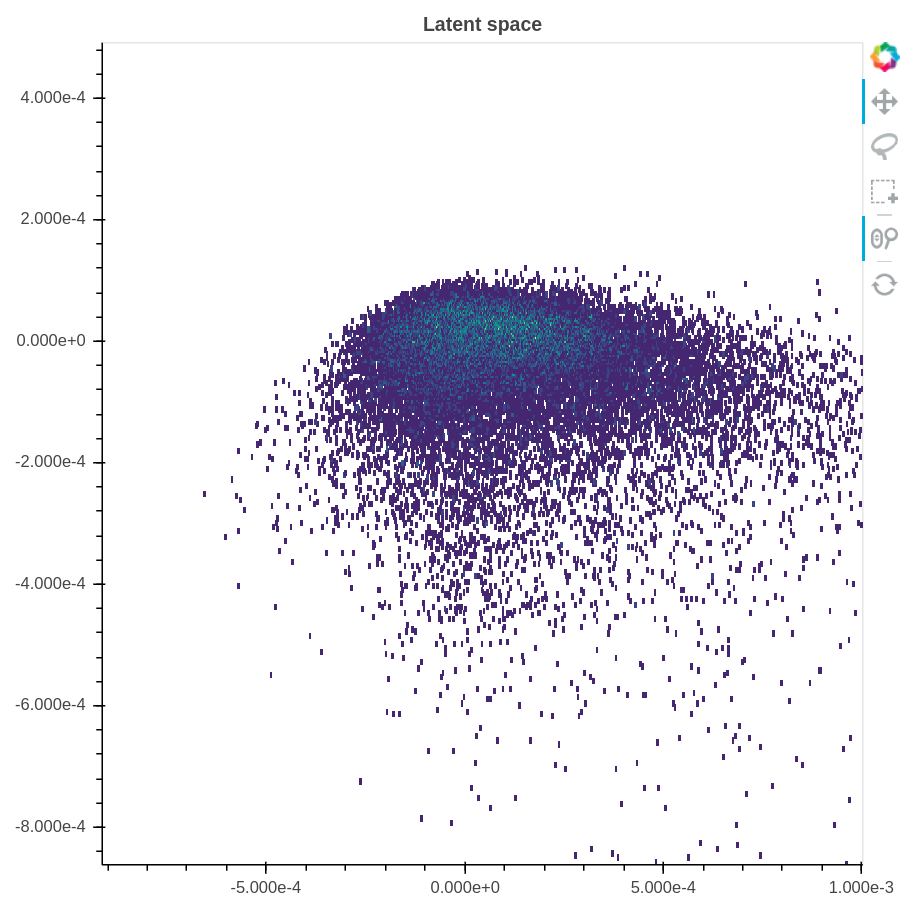